[![image](https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png)](https://www.visual-layer.com)

# Analyzing Object Detection Dataset
[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/visual-layer/fastdup/blob/main/examples/analyzing-object-detection-dataset.ipynb)
[![Open in Kaggle](https://kaggle.com/static/images/open-in-kaggle.svg)](https://kaggle.com/kernels/welcome?src=https://github.com/visual-layer/fastdup/blob/main/examples/analyzing-object-detection-dataset.ipynb)

In this tutorial, we will analyze an object detection dataset with bounding boxes and identify potential issues.

## Installation

In [1]:
!pip install -Uq fastdup plotly gdown

Now, test the installation by printing out the version. If there's no error message, we are ready to go!

In [2]:
import fastdup
fastdup.__version__

/usr/bin/dpkg


'1.31'

## Download Dataset
We will be using the [COCO minitrain](https://github.com/giddyyupp/coco-minitrain) dataset for this tutorial. COCO minitrain is a curated mini training set with about 25,000 images or 20% of the original [COCO dataset](https://cocodataset.org/#home).

Let's download the dataset into our local drive.

In [ ]:
# Download coco minitrain dataset.
!gdown --fuzzy https://drive.google.com/file/d/1iSXVTlkV1_DhdYpVDqsjlT4NJFQ7OkyK/view
!unzip -qq coco_minitrain_25k.zip

# Download csv annotations
!cd coco_minitrain_25k/annotations && gdown --fuzzy https://drive.google.com/file/d/1i12p23cXlqp1QrXjAD_vu467r4q67Mq9/view

## Load annotations
fastdup expects the annotations to be in a specific format.

We will use a simple converter to convert the COCO format JSON annotation file into the fastdup annotation dataframe. This converter is applicable to any dataset which uses COCO format.

In [3]:
import pandas as pd

In [4]:
coco_csv = 'coco_minitrain_25k/annotations/coco_minitrain2017.csv'
coco_annotations = pd.read_csv(coco_csv, header=None, names=['filename', 'col_x', 'row_y',
                                                             'width', 'height', 'label', 'ext'])

coco_annotations['split'] = 'train'  # Only train files were loaded
coco_annotations['filename'] = coco_annotations['filename'].apply(lambda x: 'coco_minitrain_25k/images/train2017/'+x)
coco_annotations = coco_annotations.drop_duplicates()


In [5]:
coco_annotations.head(3)

,filename,col_x,row_y,width,height,label,ext,split
0,coco_minitrain_25k/images/train2017/000000131075.jpg,20.23,55.98,313.49,326.50,tv,0,train
1,coco_minitrain_25k/images/train2017/000000131075.jpg,176.90,381.12,286.20,136.63,laptop,0,train
2,coco_minitrain_25k/images/train2017/000000131075.jpg,369.96,361.35,72.76,73.91,laptop,0,train


## Run fastdup

Run fastdup with annotations on the dataset. If you're running on a free Google Colab instance, specify the `num_images` to limit the run to fewer images.

In [6]:
fd = fastdup.create(input_dir='./')
fd.run(annotations=coco_annotations)

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
2023-07-31 16:56:14 [INFO] Going to loop over dir /tmp/tmpxxnrjcrl.csv
2023-07-31 16:56:14 [INFO] Found total 183544 images to run on, 183544 train, 0 test, name list 183544, counter 183544 
2023-07-31 16:56:30 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000528201.jpg. Please check bounding box file 264 341 0 5
2023-07-31 16:56:52 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000402248.jpg. Please check bounding box file 14 241 3 0
2023-07-31 16:56:59 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000141426.jpg. Please check bounding box file 106 224 2 0
2023-07-31 16:58:59 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000564557.jpg. Please check bounding box file 30 271 5 0
2023-07-31 16:59:48 [ERROR] Error: found invalid bounding bo

0

## Class distribution
The dataset contains 25k images and 183k objects, an average of 7.3 objects per image. 

Interestingly, we see a highly unbalanced class distribution, where all 80 coco classes are present here, but there is a strong balance towards the person class, that accounts for over 56k instances (30.6%). Car and Chair classes also contain over 8k instances each, while at the bottom of the list the toaster and hair drier classes contain as few as 40 instances. 

Using `Plotly` we get a useful interactive histogram. 

In [7]:
import plotly.express as px
fig = px.histogram(coco_annotations, x="label")
fig.show()

## Component gallery
View a components gallery and sort by largest objects.

laptop


100%|█| 20/20 [00:00<00:0


Finished OK. Components are stored as image files work_dir/galleries/components_[index].jpg
Stored components visual view in  work_dir/galleries/components.html
Execution time in seconds 15.8
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



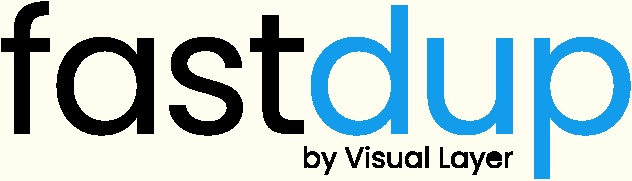
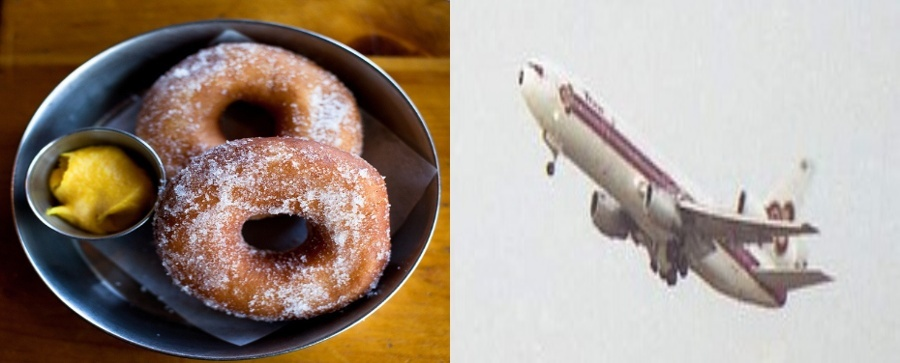
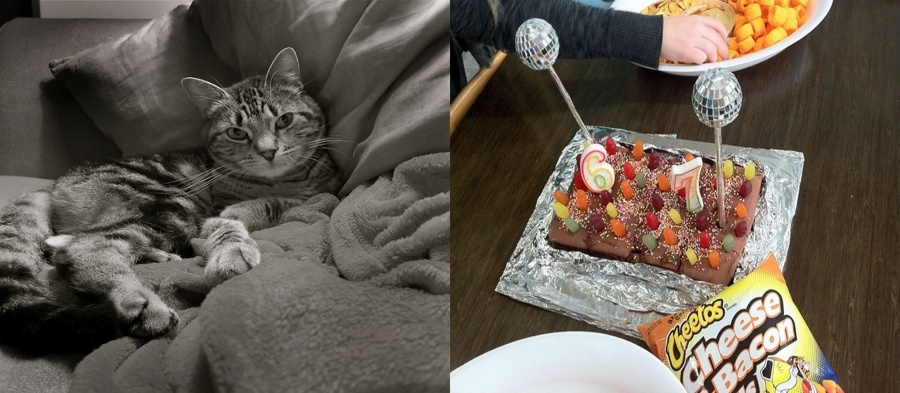
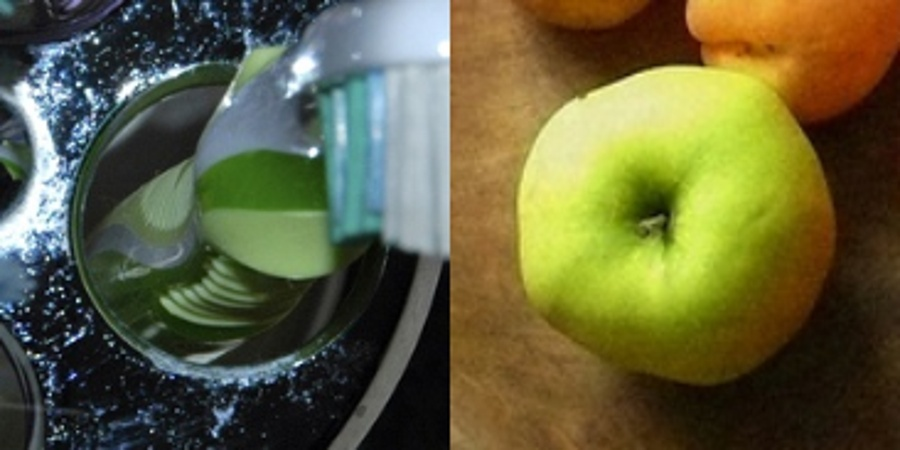
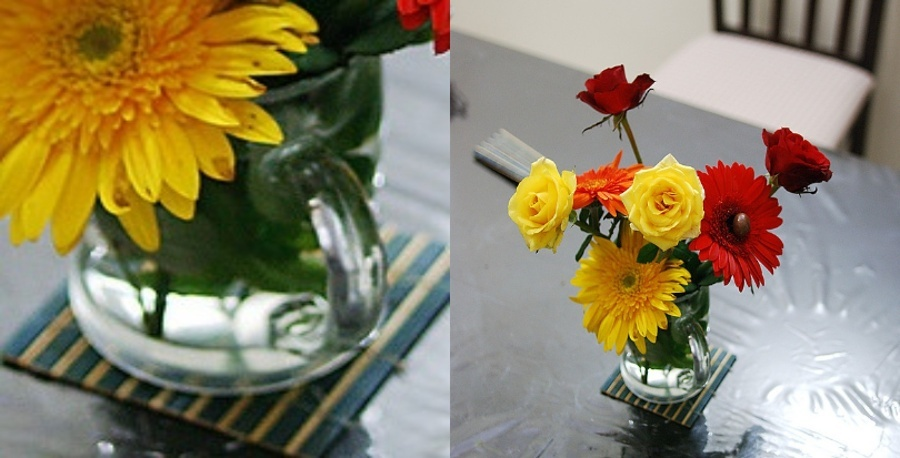
...
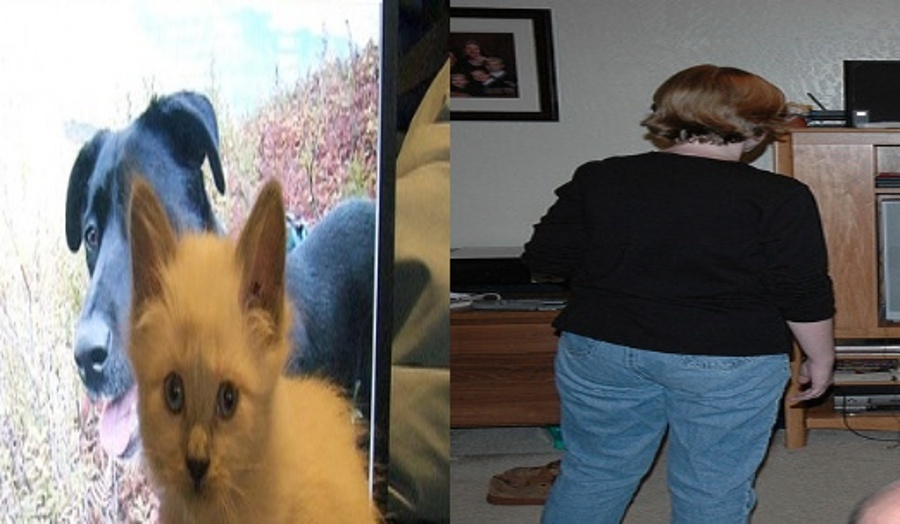
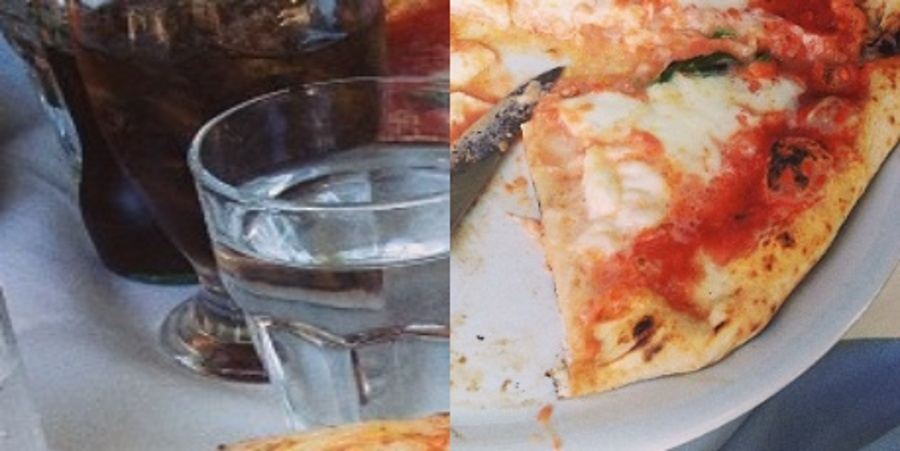
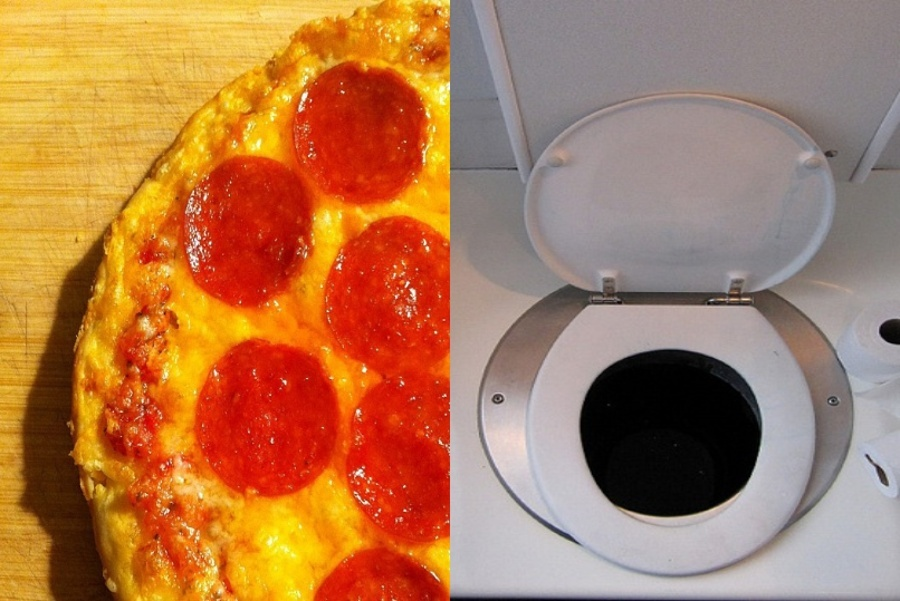
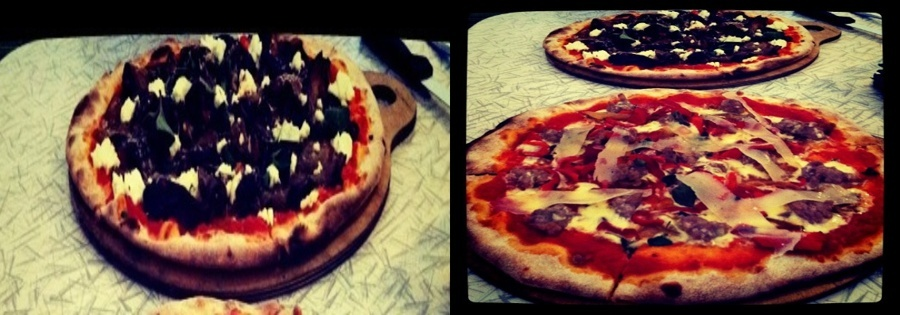
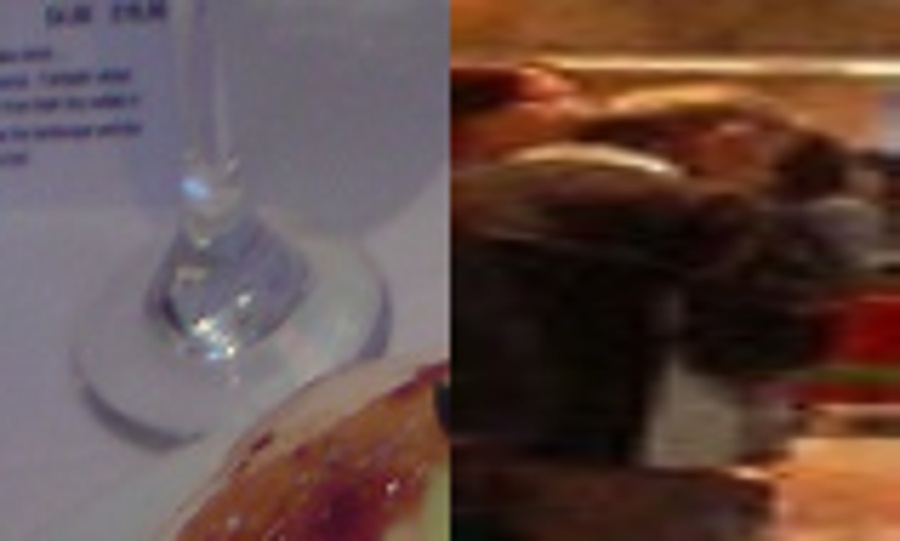

0

In [8]:
fd.vis.component_gallery(metric='size', max_width=900)

## Outliers
Visualize outliers from the run.

100%|█| 20/20 [00:00<00:0


Stored outliers visual view in  work_dir/galleries/outliers.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



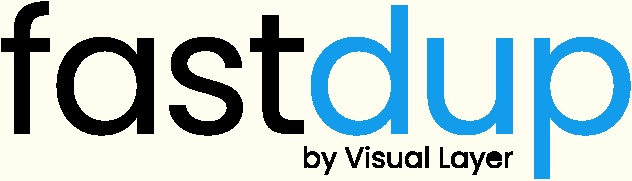
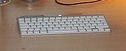
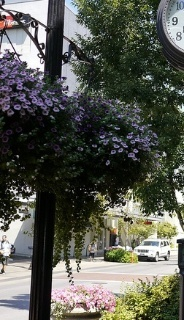
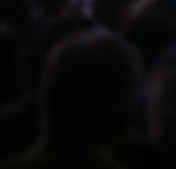
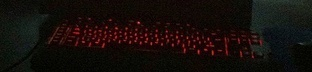
...
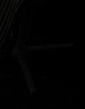
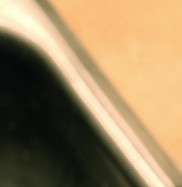
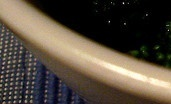
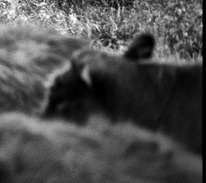
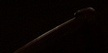

0

In [9]:
fd.vis.outliers_gallery()

## Size and shape issues
Objects come in various shapes and sizes, and sometimes objects might be incorrectly labeled or too small to be useful. We will now find the smallest, narrowest and widest objects, and asses their usefulness. 

In [10]:
fd.annotations()

,col_x,row_y,width,height,label,ext,split,crop_filename,filename,index,is_valid
0,20.23,55.98,313.49,326.50,tv,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000131075.jpg_20_55_313_326.jpg,coco_minitrain_25k/images/train2017/000000131075.jpg,0.0,True
1,176.90,381.12,286.20,136.63,laptop,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000131075.jpg_176_381_286_136.jpg,coco_minitrain_25k/images/train2017/000000131075.jpg,1.0,True
2,369.96,361.35,72.76,73.91,laptop,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000131075.jpg_369_361_72_73.jpg,coco_minitrain_25k/images/train2017/000000131075.jpg,2.0,True
3,411.68,417.87,66.32,129.44,chair,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000131075.jpg_411_417_66_129.jpg,coco_minitrain_25k/images/train2017/000000131075.jpg,3.0,True
4,367.31,363.25,72.27,67.01,tv,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000131075.jpg_367_363_72_67.jpg,coco_minitrain_25k/images/train2017/000000131075.jpg,4.0,True
...,...,...,...,...,...,...,...,...,...,...,...
183557,2.45,0.91,94.03,181.51,car,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000262103.jpg_2_0_94_181.jpg,coco_minitrain_25k/images/train2017/000000262103.jpg,164947.0,True
183558,6.10,214.53,331.31,262.83,boat,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000393195.jpg_6_214_331_262.jpg,coco_minitrain_25k/images/train2017/000000393195.jpg,164948.0,True
183559,46.37,3.34,593.63,478.66,person,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000393195.jpg_46_3_593_478.jpg,coco_minitrain_25k/images/train2017/000000393195.jpg,164949.0,True
183560,419.40,0.88,217.84,309.23,person,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000393195.jpg_419_0_217_309.jpg,coco_minitrain_25k/images/train2017/000000393195.jpg,164950.0,True


In [11]:
annot = fd.annotations()
annot['area'] = annot['width'] * annot['height']
annot['aspect'] = annot['width'] / annot['height']

/tmp/ipykernel_831871/2907564842.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_831871/2907564842.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [12]:
# Smallest 5% of objects:
smallest_objects = annot[annot['area'] < annot['area'].quantile(0.05)].sort_values(by=['area'])

# 5% of extreme aspect ratios
aspect_ratio_objects = annot[(annot['aspect'] < annot['aspect'].quantile(0.05))
                             | (annot['aspect'] > annot['aspect'].quantile(0.95))].sort_values(by=['aspect'])


Let's see the smallest objects labeled in the dataset.

In [13]:
smallest_objects.head(3)

,col_x,row_y,width,height,label,ext,split,crop_filename,filename,index,is_valid,area,aspect
110332,580.76,232.51,10.00,10.00,person,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000205392.jpg_580_232_10_10.jpg,coco_minitrain_25k/images/train2017/000000205392.jpg,99244.0,True,100.0000,1.0
131669,183.84,300.01,10.02,10.02,apple,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000320957.jpg_183_300_10_10.jpg,coco_minitrain_25k/images/train2017/000000320957.jpg,118354.0,True,100.4004,1.0
21380,301.32,175.41,10.06,10.06,person,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000407413.jpg_301_175_10_10.jpg,coco_minitrain_25k/images/train2017/000000407413.jpg,19248.0,True,101.2036,1.0


Let's visualize here how the top 3 smallest images look like.

The following image is labeled as a `person` in the dataset.

In [16]:
from IPython.display import Image
Image(filename="work_dir/crops/coco_minitrain_25kimagestrain2017000000205392.jpg_580_232_10_10.jpg")

The following image is labeled as an `apple` in the dataset.

In [17]:
Image(filename="work_dir/crops/coco_minitrain_25kimagestrain2017000000320957.jpg_183_300_10_10.jpg")

The following image is labeled as a `person` in the dataset.

In [18]:
Image(filename="work_dir/crops/coco_minitrain_25kimagestrain2017000000407413.jpg_301_175_10_10.jpg")

Considering the image size, we can hardly tell if the label is correct.

Let's also investigate objects with extreme aspect ratios.

In [19]:
aspect_ratio_objects.head(3)

,col_x,row_y,width,height,label,ext,split,crop_filename,filename,index,is_valid,area,aspect
134879,230.69,1.11,16.64,419.24,kite,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000093298.jpg_230_1_16_419.jpg,coco_minitrain_25k/images/train2017/000000093298.jpg,121215.0,True,6976.1536,0.039691
3644,1.92,136.50,11.51,263.87,person,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000002444.jpg_1_136_11_263.jpg,coco_minitrain_25k/images/train2017/000000002444.jpg,3259.0,True,3037.1437,0.043620
164234,222.84,63.49,16.19,318.20,spoon,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000116502.jpg_222_63_16_318.jpg,coco_minitrain_25k/images/train2017/000000116502.jpg,147609.0,True,5151.6580,0.050880


The following object is labeled `kite` in the dataset.

In [20]:
Image(filename="work_dir/crops/coco_minitrain_25kimagestrain2017000000093298.jpg_230_1_16_419.jpg")

In [21]:
aspect_ratio_objects.tail(3)

,col_x,row_y,width,height,label,ext,split,crop_filename,filename,index,is_valid,area,aspect
4263,33.00,216.00,602.00,18.00,boat,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000527098.jpg_33_216_602_18.jpg,coco_minitrain_25k/images/train2017/000000527098.jpg,3827.0,True,10836.0000,33.444444
77862,1.12,58.60,638.88,15.74,bench,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000444692.jpg_1_58_638_15.jpg,coco_minitrain_25k/images/train2017/000000444692.jpg,70136.0,True,10055.9712,40.589581
173236,17.27,197.91,601.64,13.43,train,0,train,work_dir/crops/coco_minitrain_25kimagestrain2017000000516740.jpg_17_197_601_13.jpg,coco_minitrain_25k/images/train2017/000000516740.jpg,155696.0,True,8080.0252,44.798213


The following object is labeled `boat` in the dataset.

In [22]:
Image(filename="work_dir/crops/coco_minitrain_25kimagestrain2017000000527098.jpg_33_216_602_18.jpg")

Look at that! The slices reveal many items that are either tiny (10x10 pixels) or have extreme aspect ratios!

## Bad Bounding Boxes

Bounding boxes that are either too small or go beyond image boundaries are flagged as bad bounding box in fastdup.

We can get a list of bad bounding boxes by reading the `atrain_features.bad.csv` file.

In [23]:
bad_bb = pd.read_csv('work_dir/full_image_run/atrain_features.bad.csv')

In [24]:
bad_bb

,index,filename,error_code
0,16,coco_minitrain_25k/images/train2017/000000262162.jpg,ERROR_BAD_BOUNDING_BOX
1,60,coco_minitrain_25k/images/train2017/000000524325.jpg,ERROR_BAD_BOUNDING_BOX
2,65,coco_minitrain_25k/images/train2017/000000524325.jpg,ERROR_BAD_BOUNDING_BOX
3,66,coco_minitrain_25k/images/train2017/000000524325.jpg,ERROR_BAD_BOUNDING_BOX
4,89,coco_minitrain_25k/images/train2017/000000131152.jpg,ERROR_BAD_BOUNDING_BOX
...,...,...,...
18587,183487,coco_minitrain_25k/images/train2017/000000131007.jpg,ERROR_BAD_BOUNDING_BOX
18588,183494,coco_minitrain_25k/images/train2017/000000131011.jpg,ERROR_BAD_BOUNDING_BOX
18589,183505,coco_minitrain_25k/images/train2017/000000262086.jpg,ERROR_BAD_BOUNDING_BOX
18590,183504,coco_minitrain_25k/images/train2017/000000262086.jpg,ERROR_BAD_BOUNDING_BOX


In [25]:
bad_bb['error_code'].value_counts()

error_code
ERROR_BAD_BOUNDING_BOX    18592
Name: count, dtype: int64

We have found 18,592 (!) bounding boxes that are either too small or go beyond image boundaries. This is 10% of the data! Filtering them would both save us grusome debugging of training errors and failures and help up provide the model with useful size objects.

## Find possible mislabels
The fastdup similarity search and gallery is a strong tool for finding objects that are possibly mislabeled. By finding each object's nearest neighbors and their classes, we can find objects with classes contradicting their neighbors' - a strong sign for mislabels.

person


100%|█| 25/25 [00:00<00:0

Finished OK. Components are stored as image files work_dir/galleries/components_[index].jpg


Stored components visual view in  work_dir/galleries/components.html
Execution time in seconds 12.3
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



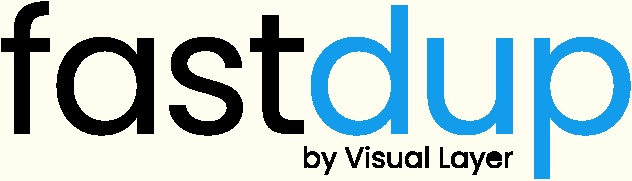
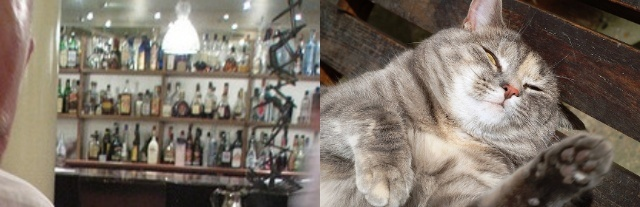
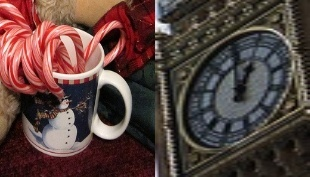
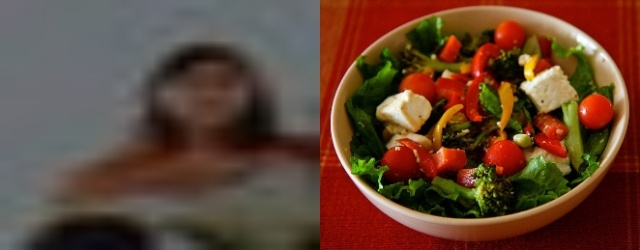
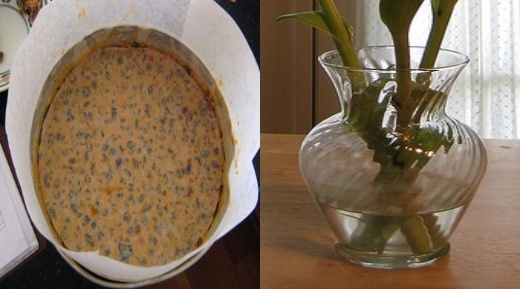
...
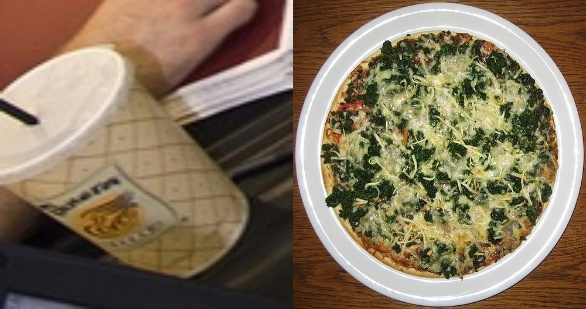
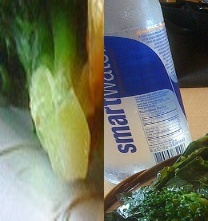
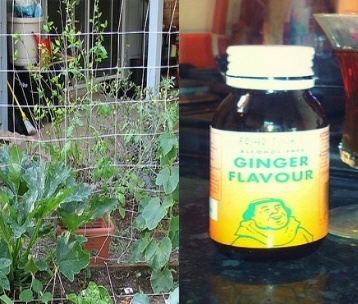
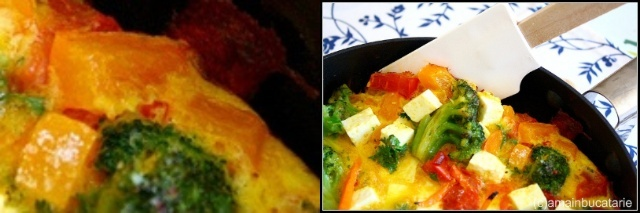
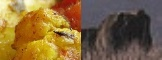

0

In [26]:
fd.vis.component_gallery(num_images=25, slice='diff')

## Wrap Up

Next, feel free to check out other tutorials -

+ ⚡ [**Quickstart**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/quick-dataset-analysis.ipynb): Learn how to install fastdup, load a dataset and analyze it for potential issues such as duplicates/near-duplicates, broken images, outliers, dark/bright/blurry images, and view visually similar image clusters. If you're new, start here!
+ 🧹 [**Clean Image Folder**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/cleaning-image-dataset.ipynb): Learn how to analyze and clean a folder of images from potential issues and export a list of problematic files for further action. If you have an unorganized folder of images, this is a good place to start.
+ 🖼 [**Analyze Image Classification Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-image-classification-dataset.ipynb): Learn how to load a labeled image classification dataset and analyze for potential issues. If you have labeled ImageNet-style folder structure, have a go!
+ 🎁 [**Analyze Object Detection Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-object-detection-dataset.ipynb): Learn how to load bounding box annotations for object detection and analyze for potential issues. If you have a COCO-style labeled object detection dataset, give this example a try. 


## VL Profiler
If you prefer a no-code platform to inspect and visualize your dataset, [**try our free cloud product VL Profiler**](https://app.visual-layer.com) - VL Profiler is our first no-code commercial product that lets you visualize and inspect your dataset in your browser. 

[Sign up](https://app.visual-layer.com) now, it's free.

[![image](https://raw.githubusercontent.com/visual-layer/fastdup/main/gallery/vl_profiler_promo.svg)](https://app.visual-layer.com)

As usual, feedback is welcome! 

Questions? Drop by our [Slack channel](https://visualdatabase.slack.com/join/shared_invite/zt-19jaydbjn-lNDEDkgvSI1QwbTXSY6dlA#/shared-invite/email) or open an issue on [GitHub](https://github.com/visual-layer/fastdup/issues).